# Random image gen using classic ML (K-Means)

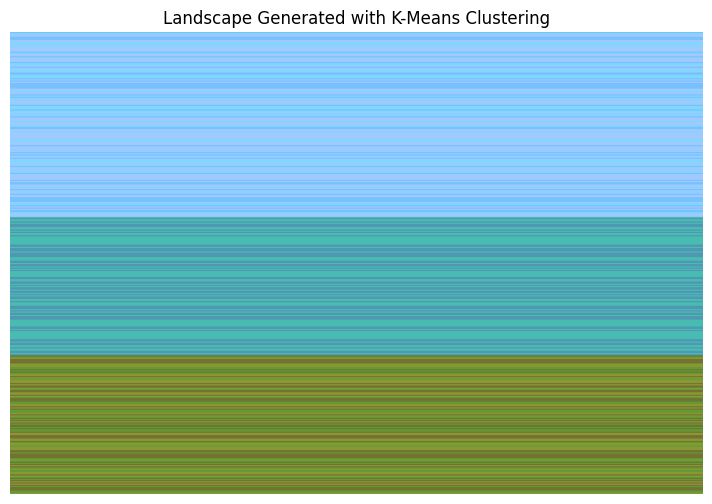

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Image dimensions
width, height = 600, 400

# Generate base pixel coordinates
x = np.linspace(0, 1, width)
y = np.linspace(0, 1, height)
xx, yy = np.meshgrid(x, y)

# Create structured colour hints for landscape:
# Top = sky (blue), middle = lake (blue-green), bottom = land (green/brown)
pixels = np.zeros((width * height, 3))

for i in range(height):
    if i < height * 0.4:  # Sky region
        pixels[i * width:(i + 1) * width] = [0.4 + np.random.rand() * 0.3, 0.7 + np.random.rand() * 0.2, 1.0]
    elif i < height * 0.7:  # Lake region
        pixels[i * width:(i + 1) * width] = [0.2 + np.random.rand() * 0.2, 0.5 + np.random.rand() * 0.3, 0.7]
    else:  # Land region
        pixels[i * width:(i + 1) * width] = [0.3 + np.random.rand() * 0.3, 0.4 + np.random.rand() * 0.3, 0.2]

# Apply K-Means clustering for colour grouping
n_clusters = 8
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(pixels)

# Replace each pixel with its cluster centroid colour
clustered_pixels = kmeans.cluster_centers_[kmeans.labels_]
image = clustered_pixels.reshape(height, width, 3)

# Display the image
plt.figure(figsize=(10, 6))
plt.imshow(image)
plt.axis('off')
plt.title('Landscape Generated with K-Means Clustering')
plt.show()

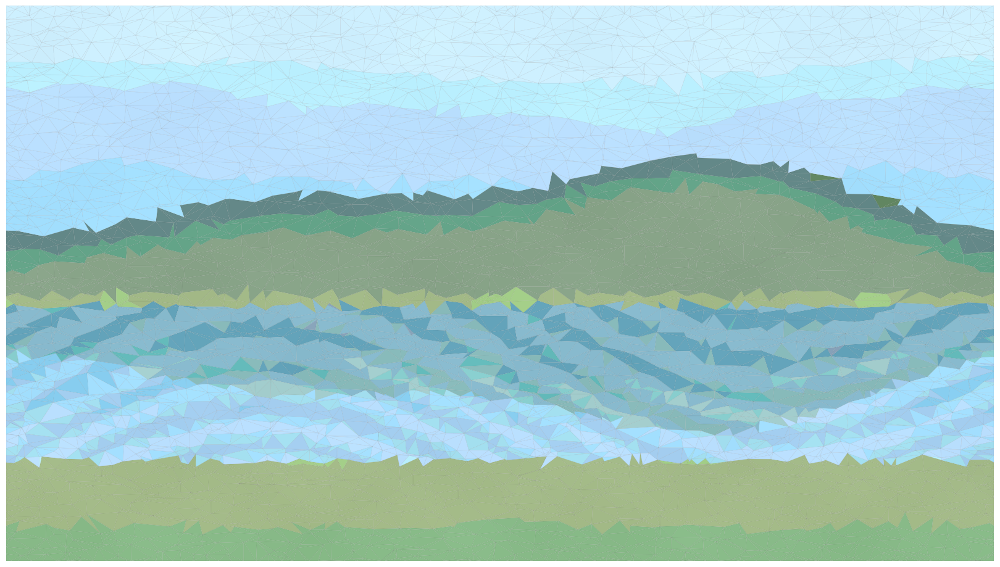

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import PolyCollection
from scipy.spatial import Delaunay
import math
import random

SEED = np.random.randint(0, 100000) #314159   # Fixed seed for exact reproducibility
W, H = 1600, 900
POINT_GRID = (70, 40)  # base grid resolution (more -> finer polygons)
JITTER = 0.012         # polygon irregularity
EXTRA_PTS = 1200       # extra random points
HORIZON = 0.52         # ~top half sky, lower half water/land
LAKE_TOP = HORIZON + 0.02
LAKE_BOTTOM = 0.82     # how deep the lake goes
GAMMA = 2.2            # gamma for pleasant tonemapping

# ------------------------------
# Utilities
# ------------------------------
def set_seed(seed):
    np.random.seed(seed)
    random.seed(seed)

def clamp01(x):
    return max(0.0, min(1.0, x))

def lerp(a, b, t):
    return a * (1 - t) + b * t

def mix(c1, c2, t):
    return tuple(lerp(c1[i], c2[i], t) for i in range(3))

def tone_map(c, gamma=GAMMA):
    # Simple gamma tonemap for nicer output
    return tuple(pow(clamp01(v), 1.0 / gamma) for v in c)

def hex_rgb(h):
    h = h.lstrip("#")
    return tuple(int(h[i:i+2], 16) / 255. for i in (0, 2, 4))

# Smooth pseudo-noise via a sum of sines (deterministic, fast, no external deps)
def smooth_noise(x, y):
    # Frequencies and phases chosen to create organic variation
    return (
        0.52 * math.sin(2.3 * x + 0.7) * math.cos(2.1 * y + 1.9) +
        0.28 * math.sin(5.7 * x - 0.3) * math.cos(3.9 * y + 0.2) +
        0.14 * math.sin(11.0 * x + 1.2) * math.cos(7.3 * y - 0.8)
    ) * 0.5 + 0.5  # map to ~[0,1]

# Mountain ridge (in normalized coords, y from 0 top to 1 bottom)
def ridge_y(x):
    # Layered sines for a natural ridge line
    r = 0.34 + 0.05 * math.sin(6.3 * x + 0.8) + 0.03 * math.sin(12.4 * x + 1.7)
    return clamp01(r)

# Tree line blobs near the ridge (silhouettes)
def tree_mask(x, y):
    r = ridge_y(x)
    # trees appear just below ridge (y a bit larger than r)
    band = clamp01((y - r) / 0.03)  # 0 at ridge, 1 below ~3% height
    n = smooth_noise(8 * x, 40 * y)
    return clamp01((1 - band) * (0.6 + 0.4 * n))

# Water ripple factor
def ripple(x, y):
    # Horizontal ripple bands, subtle
    return 0.5 + 0.5 * math.sin(90.0 * y + 15.0 * math.sin(6.0 * x))

# ------------------------------
# Palette
# ------------------------------
SKY_TOP = hex_rgb("#9ED8FF")     # light blue
SKY_HORIZ = hex_rgb("#58A7E5")   # deeper near horizon

RIDGE_DARK = hex_rgb("#2E4A3A")  # dark pine
RIDGE_LIGHT = hex_rgb("#3E6B50") # lighter green

LAKE_BASE = hex_rgb("#3E8AC9")   # core lake blue
LAKE_SHALLOW = hex_rgb("#62B0D9")

LAND_NEAR = hex_rgb("#4F7C3A")   # near grass
LAND_FAR  = hex_rgb("#6B9352")

SHADOW = hex_rgb("#2B3A4A")

# ------------------------------
# Colour Field (procedural)
# ------------------------------
def base_color(x, y):
    """
    x, y in [0,1], y=0 top.
    Produces a landscape with sky, ridge, trees, lake with reflection, and land.
    """
    # Sky gradient
    if y < HORIZON:
        # Sky up to ridge
        sky_t = clamp01(y / (HORIZON * 0.95))
        c = mix(SKY_TOP, SKY_HORIZ, sky_t)

        # Mountain ridge silhouette cutting into sky
        ry = ridge_y(x)
        if y > ry:
            # below ridge line -> mountain body
            t = clamp01((y - ry) / 0.10)  # darker near ridge, lighter lower
            c = mix(RIDGE_DARK, RIDGE_LIGHT, t)

            # Add tree blobs near ridge
            tm = tree_mask(x, y)
            c = mix(c, RIDGE_DARK, 0.55 * tm)

        # Gentle atmospheric noise in sky
        a = 0.05 * (smooth_noise(3 * x, 3 * y) - 0.5)
        c = tuple(clamp01(ci + a) for ci in c)
        return c

    # Water / land below horizon
    # Lake band
    if LAKE_TOP <= y <= LAKE_BOTTOM:
        # Reflect y across horizon
        y_ref = 2 * HORIZON - y
        y_ref = clamp01(y_ref)

        # Sample what the sky/ridge would have been at reflected y
        # — combine with water tint and ripples
        # Start with reflected sky
        sky_t = clamp01(y_ref / (HORIZON * 0.95)) if HORIZON > 0 else 1.0
        ref_c = mix(SKY_TOP, SKY_HORIZ, sky_t)

        # If reflected position is under ridge, tint darker
        ry = ridge_y(x)
        if y_ref > ry:
            t = clamp01((y_ref - ry) / 0.12)
            ref_c = mix(RIDGE_LIGHT, RIDGE_DARK, 0.5 + 0.5 * t)

        # Water blend
        lake_t = clamp01((y - LAKE_TOP) / (LAKE_BOTTOM - LAKE_TOP + 1e-6))
        water_c = mix(LAKE_BASE, LAKE_SHALLOW, 0.25 + 0.75 * lake_t)

        # Ripples modulate brightness
        r = ripple(x, y) * 0.12
        c = mix(ref_c, water_c, 0.58)  # base reflectivity blend
        c = tuple(clamp01(ci + (r - 0.06)) for ci in c)

        # Slight lateral colour drift for variation
        drift = 0.04 * (smooth_noise(5 * x, 1.5 * y) - 0.5)
        c = (clamp01(c[0] + drift), clamp01(c[1] + 0.5 * drift), clamp01(c[2]))

        return c

    # Land below lake (shore/grass)
    t = clamp01((y - LAKE_BOTTOM) / (1.0 - LAKE_BOTTOM + 1e-6))
    c = mix(LAND_FAR, LAND_NEAR, t)

    # Add shadow streaks to land for texture
    s = smooth_noise(6 * x, 6 * y)
    c = mix(c, SHADOW, 0.10 * (s - 0.5) + 0.08)

    return c

# ------------------------------
# Point Set and Triangulation
# ------------------------------
def generate_points():
    gx, gy = POINT_GRID
    xs = np.linspace(0, 1, gx)
    ys = np.linspace(0, 1, gy)
    pts = []
    for yy in ys:
        for xx in xs:
            jx = (np.random.rand() - 0.5) * 2 * JITTER
            jy = (np.random.rand() - 0.5) * 2 * JITTER
            pts.append([clamp01(xx + jx), clamp01(yy + jy)])

    # Extra random points, denser near horizon & lake for detail
    for _ in range(EXTRA_PTS):
        xx = np.random.rand()
        # Bias y distribution toward lake region
        r = np.random.rand()
        if r < 0.55:
            yy = np.random.uniform(LAKE_TOP - 0.06, LAKE_BOTTOM + 0.06)
        elif r < 0.75:
            yy = np.random.uniform(0.0, HORIZON + 0.05)
        else:
            yy = np.random.uniform(LAKE_BOTTOM - 0.02, 1.0)

        yy = clamp01(yy)
        pts.append([xx, yy])

    # Add a dense border to ensure clean edges
    border = 80
    for i in range(border):
        t = i / (border - 1)
        pts.append([t, 0.0])
        pts.append([t, 1.0])
        pts.append([0.0, t])
        pts.append([1.0, t])

    return np.array(pts)

def triangulate(pts):
    # Delaunay triangulation in normalized coords
    return Delaunay(pts)

# ------------------------------
# Render
# ------------------------------

set_seed(SEED)
pts = generate_points()
tri = triangulate(pts)

# Build triangle polygons in pixel coordinates and colour each by centroid
polys = []
colors = []

for simplex in tri.simplices:
    tri_pts = pts[simplex]
    cx, cy = tri_pts.mean(axis=0)
    # Color at centroid
    c = base_color(cx, cy)

    # Mild polygon-wise colour quantization for stronger stained-glass look
    q = 9  # quantization levels
    c = tuple(np.floor(np.array(c) * q) / max(1, (q - 1)))
    c = tone_map(c)

    # Add slight centroid-based noise for organic variation
    n = 0.03 * (smooth_noise(10 * cx, 10 * cy) - 0.5)
    c = tuple(clamp01(ci + n) for ci in c)

    # Convert polygon to pixel space
    px = (tri_pts[:, 0] * W).tolist()
    py = (tri_pts[:, 1] * H).tolist()
    # Matplotlib origin is top-left if we invert y-axis later; keep as-is
    polys.append(list(zip(px, py)))
    colors.append(c)

fig = plt.figure(figsize=(W / 100, H / 100), dpi=100)
ax = plt.axes([0, 0, 1, 1])
ax.set_xlim(0, W)
ax.set_ylim(H, 0)  # invert y so y=0 is top
ax.axis("off")

coll = PolyCollection(polys, facecolors=colors, edgecolors=(0, 0, 0, 0.08), linewidths=0.4, antialiased=True)
ax.add_collection(coll)

# Optional: subtle vignette overlay
vignette = plt.Circle((W / 2, H / 2), radius=max(W, H) * 0.65, color=(0, 0, 0), fill=False, lw=0)
vignette.set_alpha(0.0)  # disabled by default

fig.savefig("images/lakeML.png", bbox_inches='tight', pad_inches=0)

plt.show()


# Gen AI

b'{"created":1759696294,"data":[{"url":null,"b64_json":"iVBORw0KGgoAAAANSUhEUgAABAAAAAQACAIAAADwf7zUAAEAAElEQVR4nHT9a5IdO84sCjoYqV11+l678x9Om/UIeiz9+E5Juej9A+4ORKo6q7akzIwVQeLhcIAIsv7v/4//J/kQBIACgP6n/g2C/c+C/yYJoFCo/r5/0x8DcjEBffjHr/QXiyBqfrD+2f/V/iZju5jfFUHQF/f/qbGR+kw+XhpKFQpFfct5GDWO10MJgjhVGSCAqtJlleHg+MckqlDVD6oC6uD0V+VXzKNI1OlhM0O+bLmxv0AQuCRvvgNAtkLIy9K//Hsyeqpzyt+clrWeVKg6VefX11cVyM/nfn8+n/vpWxdbRqAmjKoqDQ2UCOkLzjl1CAK5JNYSsRJgSdKFXGfTAvEhfYOyyXhK+gN+bn4HkFbqaGrbX4vnhz0RrG1rI9t6f7ptJXZ2l73SP8zjrRdkPP3dLQ27bJ+QSduyuOx4TcRuB6IVvOVLC7xKY+TcQzImo/+yodoMI0TJj8GDKn+7xkMrnf6YFceBA2YMP+RPLBlLZyPnARbAdu4pbkVQUsaeADOWgn1pjaAYnc80bDu6gfAEGEBiLrQNFgp1LAIG1WysGWzcxz8dgdxxCiyLiX2uDy2DLBJHfnMRGY2+NM3GHoNH9L9sZr7GWaKXWvi5hBE0bzvT9ZEX2PaCDDnga+jQvThqYs3n44NVLWDJvJaWGa3oQ7UGsP+5Le/l5pF5RdhVlNz0mbOu62eXw0dwoSr+QT7PMRJb5bUkiwL3/TV13ZxG/iKZGHss04lfGojipsyvoheWfxjFVeFUj73KNiNBjor2OCNWTMjUneLcVlz7oQfo+xrEOg6yKC3LIYVHVadvybHxxBXf74WBLZ+t1sBR7ARkyTplqhKth3nRoFPveedR0bHlg+Aktrkt3rDuUethUSTvi9z8/XSyrW3m

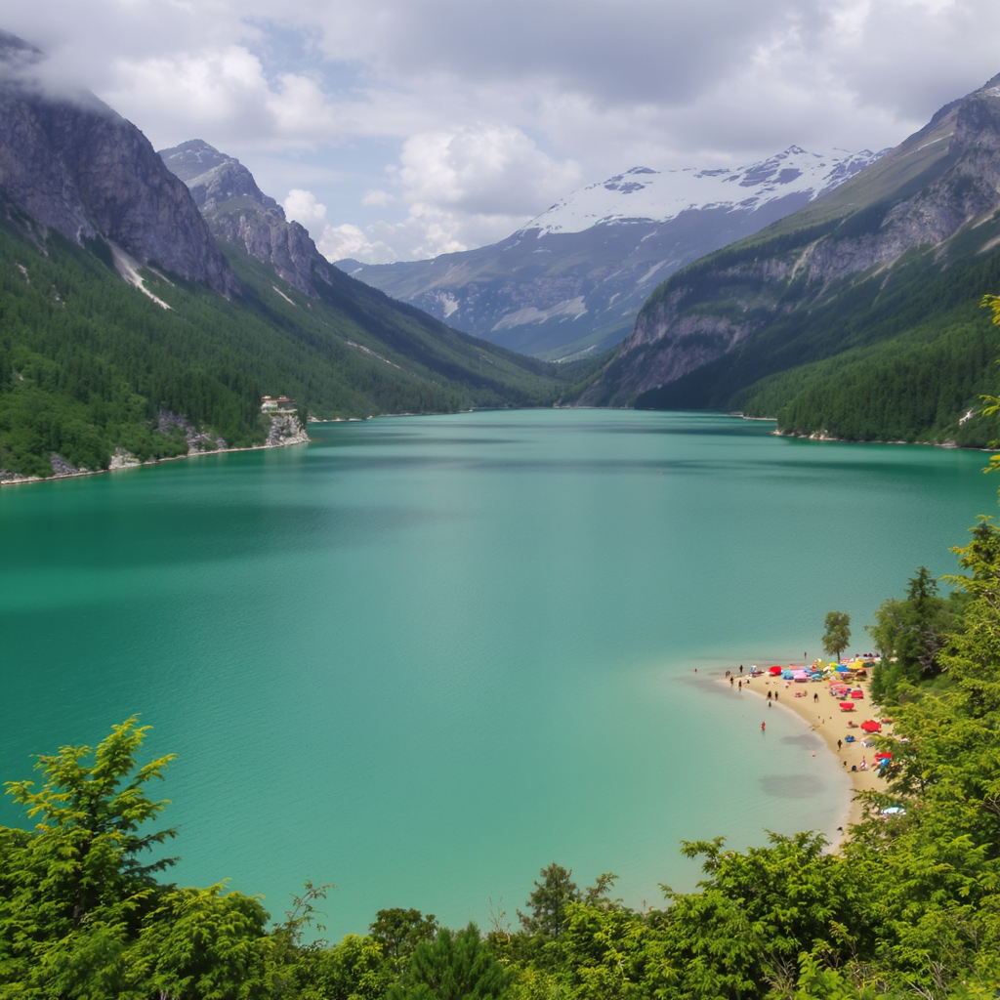

In [13]:
import requests
import base64
import configparser; config = configparser.RawConfigParser()
config.read('keys//keys.ini')
api_key = config['keys']['AzureAIFSwedenProject01']

# Replace with your actual endpoint and API key
endpoint = "https://aifsweden.services.ai.azure.com/openai/deployments/FLUX.1-Kontext-pro/images/generations?api-version=2025-04-01-preview"

headers = {
    "Content-Type": "application/json",
    "Authorization": f"Bearer {api_key}"
}

payload = {
    "prompt": "A photograph of a beautiful lake with green hills in the background. There is a small beach with people sunbathing and playing. It looks like a beautiful location of outstanding natural beauty.",
    "size": "1024x1024",
    "n": 1,
    "model": "flux.1-kontext-pro"
}

response = requests.post(endpoint, headers=headers, json=payload)
print(response.content)
response.raise_for_status()

# Extract base64 image and save as PNG
image_base64 = response.json()["data"][0]["b64_json"]
image_bytes = base64.b64decode(image_base64)

with open("images/lake.png", "wb") as f:
    f.write(image_bytes)

print("Image saved")

from IPython.display import Image
Image("images/lake.png")



## Gen AI to create a realistic version of the ML (without telling it what it is)

b'{"created":1759697042,"data":[{"url":null,"b64_json":"iVBORw0KGgoAAAANSUhEUgAABAAAAAQACAIAAADwf7zUAAEAAElEQVR4nGT9W5ZlOa4riILUyqr+9+KO+q7WVZqI+wGAmp7H984ID7P10JRIEHyq/p//3/9LFEEAVSBnOCQIDFHo6gI4HL+IBeCcUyiCJKsKAEjCfwrQ36uKnJmpqq5GYWZQVVWcIQDy9KkuAF0ForvBqSqUPwrlD84Xobo57O58bdZQ/l/+tSvK7/xLfTO6S2ut7rxoXzH79/ceENQnEdVF5hurAPLzsrxWf+/qITnoc7JgECy0940kWKCWWFWoAvYHqMJw8kDlPS6QU7tZKA704QDuXO0niYI+UAseoFBF1gyrWFUsVqFQMwRLp1FFYjja3gbquz8kc+b1jt4rz5YVSO4+asMkNtlJfESoqnpfOyRYBKu1Kv2E3V1Vk4XWfp3XJrnKppT20OLBIcpiGVmqJx4gOieK5kqCP0wfQz0WUN7Y93PquAuFap9dVVUOwGcqqZt9Mb1XkW/QAkGiimNBrQgoI2wrz4wIVuTHJ074ecE9L7KiAfS2EJGy/aLyS/5RIhSqS9tmPHgr0MF+gSD7/1HKskZ7qXqeBvS5Yy2wfPphuwtfPbFufM58j8VSriet/IJST5Kolu4I61bZUK3NJqfeHvQ+ow/wIYS/tbsB3jtWKwAoQxOYFdBnX6WjJfnOPSL79AI1XKm6gs2q+p1fdI2rjZUD3g0mr3UPVdVREH3zlE7EgKBv0To5ZKHfeS6OVXlp2tUCQUgDKTgvoyJRJRSqERZ1YS6Ntz3EzBRQXas5fXzA3u2ZyO9Xbmoxg6D0t1Akq9pns/rg5USx8rDWUEEwo6qIXloJCLIgKzN8iqkn/R9LV4X3aRGt4sNtPabkAf3O4iNDWWW/4yyDkH63as5831Osyrv3vIpGz4cilK0ogLXLrwrIVlX3f//+

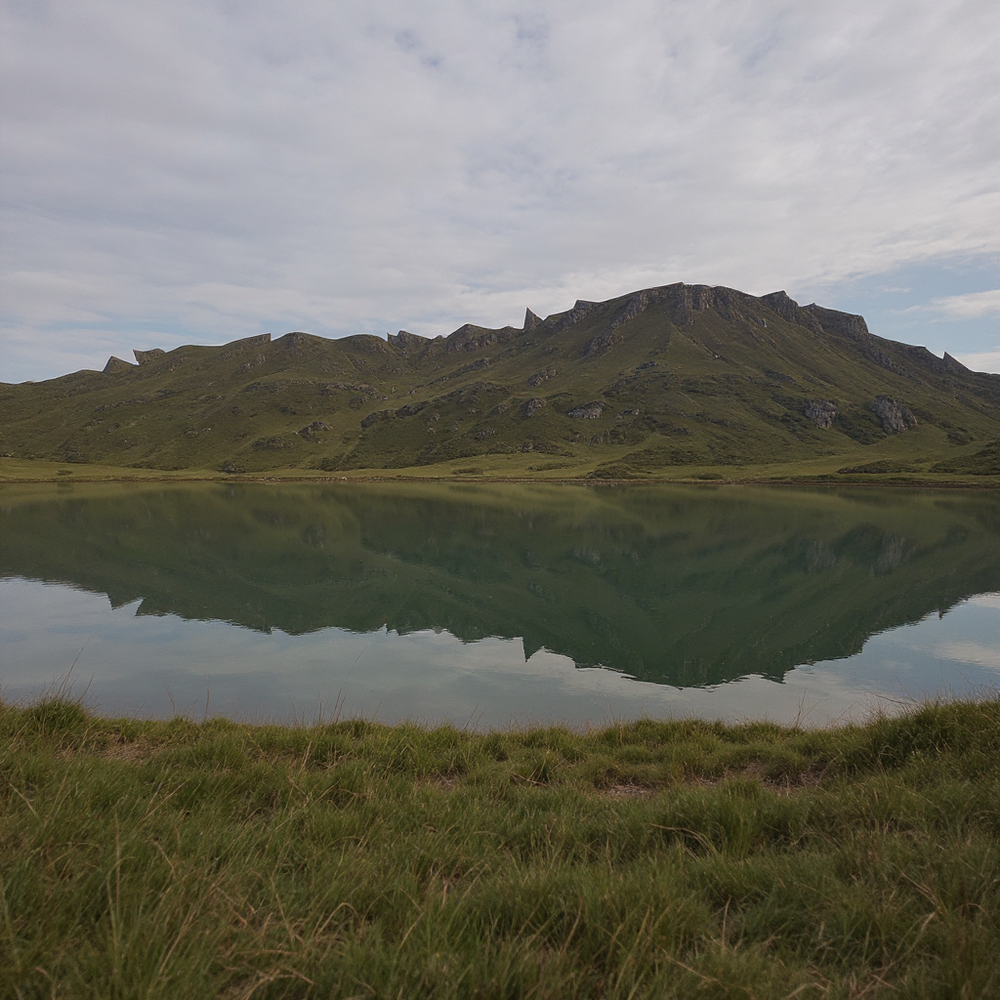

In [18]:
import requests
import base64
import configparser; config = configparser.RawConfigParser()
config.read('keys//keys.ini')
api_key = config['keys']['AzureAIFSwedenProject01']

endpoint = "https://aifsweden.services.ai.azure.com/openai/deployments/FLUX.1-Kontext-pro/images/edits?api-version=2025-04-01-preview"

headers = {
    "Authorization": f"Bearer {api_key}"
}

files = {
    "model": (None, "flux.1-kontext-pro"),
    "image": ("imgea_to_edit.png", open("images/lakeML.png", "rb")),
    "prompt": (None, "Take the image and make it look realistic."),}

response = requests.post(endpoint, headers=headers, files=files)
print(response.content)
response.raise_for_status()

image_base64 = response.json()["data"][0]["b64_json"]
image_bytes = base64.b64decode(image_base64)

with open("images/lake2.png", "wb") as f:
    f.write(image_bytes)

print("Image saved")

from IPython.display import Image
Image("images/lake2.png")


# Open CV spot the diff

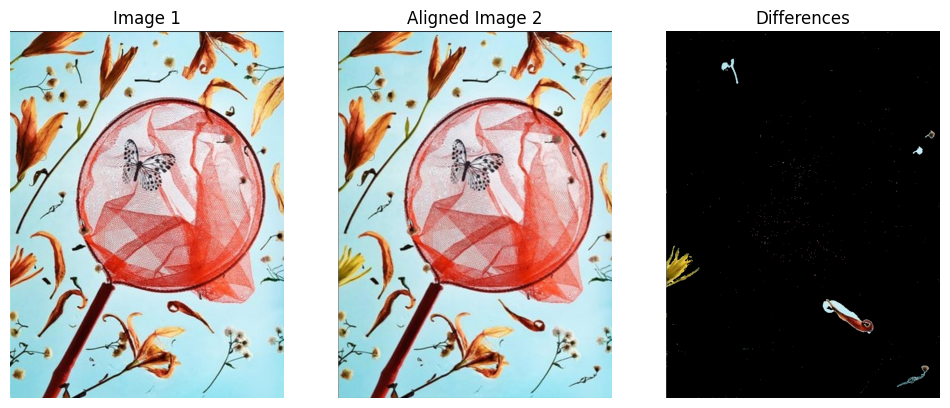

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load images
img1 = cv2.imread("images/BF1.JPG")
img2 = cv2.imread("images/BF2.JPG")

# Convert to grayscale for feature detection
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Use ORB feature detector
orb = cv2.ORB_create(5000)
kp1, des1 = orb.detectAndCompute(gray1, None)
kp2, des2 = orb.detectAndCompute(gray2, None)

# Match features using BFMatcher
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# Extract matched keypoints
pts1 = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
pts2 = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

# Compute homography
H, _ = cv2.findHomography(pts2, pts1, cv2.RANSAC)

# Warp img2 to align with img1
aligned_img2 = cv2.warpPerspective(img2, H, (img1.shape[1], img1.shape[0]))

# Compute difference
diff = cv2.absdiff(img1, aligned_img2)
mask = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)

# Threshold to highlight differences
_, imask = cv2.threshold(mask, 30, 255, cv2.THRESH_BINARY)

# Apply mask
canvas = np.zeros_like(img1)
canvas[imask > 0] = aligned_img2[imask > 0]

# Display results
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title('Image 1')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(aligned_img2, cv2.COLOR_BGR2RGB))
plt.title('Aligned Image 2')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
plt.title('Differences')
plt.axis('off')

plt.show()

I can’t directly edit and send back the JPG from this chat, but I can give you a ready-to-run Jupyter/Python script that will:

- compare the left and right halves of the image you uploaded,
- detect visual differences,
- draw red circles around each difference on the original side-by-side image,
- and save a single annotated JPG (annotated.jpg).

Run the code below in a Jupyter cell after saving your side-by-side image as input.jpg in the same folder. The script uses OpenCV + NumPy and will show and save the result.

Python code (copy & paste into a Jupyter notebook cell):


import cv2
import numpy as np
import matplotlib.pyplot as plt

# Parameters you can tweak
INPUT_FILENAME = "input.jpg"      # put your side-by-side image here
OUTPUT_FILENAME = "annotated.jpg" # annotated output
MIN_CONTOUR_AREA = 50            # ignore tiny specks (increase to remove noise)
DILATE_KERNEL = (9,9)            # helps join close diff blobs so a single circle covers them
CIRCLE_PAD = 8                

(np.float64(-0.5), np.float64(699.5), np.float64(466.5), np.float64(-0.5))

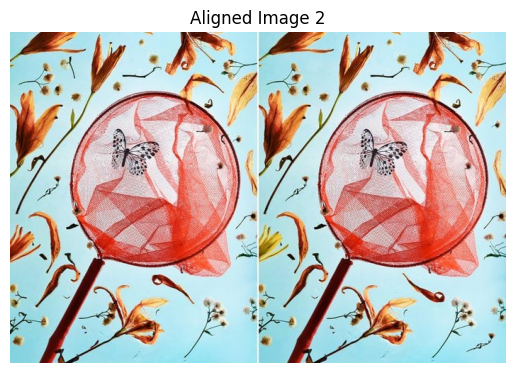

In [36]:
from openai import AzureOpenAI
import os
import base64
from azure.identity import DefaultAzureCredential, get_bearer_token_provider

token_provider = get_bearer_token_provider(
    DefaultAzureCredential(), "https://cognitiveservices.azure.com/.default"
)


# Read image file as bytes
with open("images/BFBoth.JPG", "rb") as f:
    image_bytes = f.read()

# Encode image bytes to base64
def encode_image_from_bytes(image_bytes):
    return base64.b64encode(image_bytes).decode("utf-8")

base64_image = encode_image_from_bytes(image_bytes)

client = AzureOpenAI(
  azure_endpoint = "https://aifsweden.openai.azure.com/", 
  azure_ad_token_provider=token_provider,
  api_version="2025-03-01-preview"
)

def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

response = client.responses.create(
    model="gpt-5-mini",
    input=[
        {"role": "user", "content": "List all the differences between these two images. Mark/circle the differences directly on the image in red and return the annotated copy as a JPG. Mark every difference I can find and return a single annotated JPG, not multiple images. Give me the python code so I can run in a jupyter notebook"},
        {
            "role": "user",
            "content": [
                {
                    "type": "input_image",
                    "image_url": f"data:image/png;base64,{base64_image}"
                }
            ]
        }
    ]
)

print(response.output_text)

import numpy as np

# Decode image_bytes to numpy array
image_np = cv2.imdecode(np.frombuffer(image_bytes, np.uint8), cv2.IMREAD_COLOR)

plt.imshow(cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB))
plt.title('Aligned Image 2')
plt.axis('off')

Saved annotated image to 'images/annotated.jpg' with 15 marked differences.


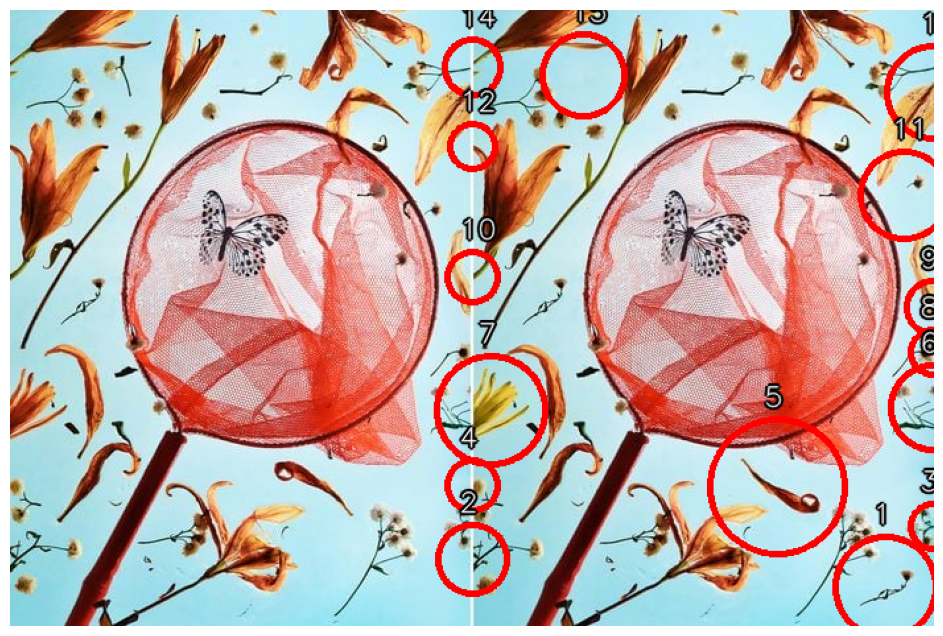

In [38]:

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Parameters you can tweak
INPUT_FILENAME = "images/BFBoth.JPG"      # put your side-by-side image here
OUTPUT_FILENAME = "images/annotated.jpg" # annotated output
MIN_CONTOUR_AREA = 50            # ignore tiny specks (increase to remove noise)
DILATE_KERNEL = (9,9)            # helps join close diff blobs so a single circle covers them
CIRCLE_PAD = 8                   # make the drawn circle slightly bigger than detected region

# Load image
img = cv2.imread(INPUT_FILENAME)
if img is None:
    raise FileNotFoundError(f"Could not open '{INPUT_FILENAME}'. Make sure the file exists.")

h, w = img.shape[:2]
# Split into left and right halves
left = img[:, :w//2].copy()
right = img[:, w//2:].copy()

# Convert to gray and blur a bit to reduce noise
left_gray = cv2.cvtColor(left, cv2.COLOR_BGR2GRAY)
right_gray = cv2.cvtColor(right, cv2.COLOR_BGR2GRAY)
left_blur = cv2.GaussianBlur(left_gray, (5,5), 0)
right_blur = cv2.GaussianBlur(right_gray, (5,5), 0)

# Absolute difference, threshold to get binary regions of change
diff = cv2.absdiff(left_blur, right_blur)
_, th = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)  # threshold level may be tuned

# Morphological operations to join small nearby regions
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, DILATE_KERNEL)
th = cv2.dilate(th, kernel, iterations=2)
th = cv2.medianBlur(th, 5)

# Find contours in the diff map
contours, _ = cv2.findContours(th, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Make a copy of the original (side-by-side) to annotate
annotated = img.copy()

# Collect circles (center in full-image coords) for visualization
circles = []
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area < MIN_CONTOUR_AREA:
        continue
    # Get bounding circle on the RIGHT-HALF coordinate system (contours are from the diff image sized as halves)
    (cx, cy), radius = cv2.minEnclosingCircle(cnt)
    # Convert to ints
    cx = int(cx)
    cy = int(cy)
    radius = int(radius)
    # Translate center to full-image coordinates:
    # diff image used halves, which are the same size as left/right. Circles located in half -> shift x by w//2 for right-half display.
    # We want to mark on the full side-by-side image at the location corresponding to the right half (so add offset).
    cx_full = cx + (w // 2)
    cy_full = cy
    radius_full = radius + CIRCLE_PAD
    circles.append((cx_full, cy_full, radius_full))

# Optionally merge/merge overlapping circles to one if desired
# Draw circles on the annotated image in red (BGR)
for (cx, cy, r) in circles:
    cv2.circle(annotated, (cx, cy), r, (0,0,255), 3)  # red, thickness 3
    # draw a small numbered label (white text with black border)
for i, (cx, cy, r) in enumerate(circles, 1):
    text = str(i)
    # draw outline
    cv2.putText(annotated, text, (cx - 10, cy - r - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,0,0), thickness=3, lineType=cv2.LINE_AA)
    cv2.putText(annotated, text, (cx - 10, cy - r - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,255,255), thickness=1, lineType=cv2.LINE_AA)

# Save annotated image
cv2.imwrite(OUTPUT_FILENAME, annotated)
print(f"Saved annotated image to '{OUTPUT_FILENAME}' with {len(circles)} marked differences.")

# Display inline in Jupyter
annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12,8))
plt.imshow(annotated_rgb)
plt.axis('off')
plt.show()
